In [1]:
# AIDA QC

# v230803

In [2]:
# Import modules

In [3]:
import anndata
import logging
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scrublet as scr
import matplotlib.pyplot as plt
import pybiomart as biomart
from scipy.stats import median_abs_deviation
from matplotlib import colors
from matplotlib import rcParams

In [4]:
%matplotlib inline
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 180, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                         9.2.0
appdirs                     1.4.4
asttokens                   NA
attr                        21.4.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
bottleneck                  1.3.5
brotli                      NA
cattr                       NA
cattrs                      NA
certifi                     2022.12.07
cffi                        1.15.1
charset_normalizer          2.0.4
cloudpickle                 2.0.0
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.11.0
dask                        2022.7.0
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
entrypoints                 0.4
exceptiongroup              1.1.0
executing                   0.8.3
fsspec                      2022.3.0
future                      0.18.3
h5py   

In [5]:
# Read in data

In [6]:
adata = sc.read_h5ad("/home/icb/mairi.mcclean/data/local.h5ad")
adata

AnnData object with n_obs × n_vars = 1058909 × 36266
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'alignment_software', 'library_uuid', 'assay_ontology_term_id', 'library_starting_quantity', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'sample_uuid', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'sample_derivation_process', 'donor_BMI_at_collection', 'suspension_derivation_process', 'suspension_enriched_cell_types', 'suspension_percent_cell_viability', 'suspension_uuid', 'suspension_type', 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'donor_living_at_sample_collection', 'organism_ontology_term_id', 'disease_ontology_term_id', 'sex_ontology_term_id', 'Country', 'nCount_RNA', 'nFeature_RNA', 'Ethnicity_Selfreported', 'TCR_VDJdb', 'TCRa_V_gene', 'TCRa_D_gene', 'TCRa_J_gene', 'TCRa_C_gene', 'TCRb_V_gene', 'TCRb_D_gene', 'TCRb_J_gene', 'TCRb_C_gene', 'TCR_Clonality', 'TCR_Clone_ID', 'BCR_VDJ_V_call', 'BCR_VDJ_D_ca

In [7]:
adata.X = adata.X.astype("float32")

In [8]:
# Filter out unrequired data

In [9]:
#layers
del adata.obsm
del adata.uns
adata

AnnData object with n_obs × n_vars = 1058909 × 36266
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'alignment_software', 'library_uuid', 'assay_ontology_term_id', 'library_starting_quantity', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'sample_uuid', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'sample_derivation_process', 'donor_BMI_at_collection', 'suspension_derivation_process', 'suspension_enriched_cell_types', 'suspension_percent_cell_viability', 'suspension_uuid', 'suspension_type', 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'donor_living_at_sample_collection', 'organism_ontology_term_id', 'disease_ontology_term_id', 'sex_ontology_term_id', 'Country', 'nCount_RNA', 'nFeature_RNA', 'Ethnicity_Selfreported', 'TCR_VDJdb', 'TCRa_V_gene', 'TCRa_D_gene', 'TCRa_J_gene', 'TCRa_C_gene', 'TCRb_V_gene', 'TCRb_D_gene', 'TCRb_J_gene', 'TCRb_C_gene', 'TCR_Clonality', 'TCR_Clone_ID', 'BCR_VDJ_V_call', 'BCR_VDJ_D_ca

In [10]:
#.var
adata.var = adata.var.drop(columns= ['feature_biotype', 'feature_reference'])

In [11]:
#.obs
adata.obs['sex_ontology_term_id'].value_counts()

PATO:0000383    582152
PATO:0000384    476757
Name: sex_ontology_term_id, dtype: int64

In [12]:
# Check batch info for database
adata.obs['library_uuid'].value_counts()

925ed908-cb3d-4eeb-8db9-cf8967de971d    20412
95b09160-b9c3-4035-8263-205a4a11e118    19159
0b1175aa-350d-4e0a-8535-d667980cb949    19126
5b6184ee-60b3-4f4e-ad21-c8424f7a4a8b    19090
f75482e2-85c9-414b-a2d3-fd6505fc3e0b    18883
                                        ...  
5397ecce-4f99-4f7c-b833-000c8d57cdb1     6808
e6e2a3ba-84af-43b7-b913-0ad174393cae     6434
91f8d6ee-8ed5-40c8-9597-f0d87a9f9922     5184
c0eb5cbc-7a22-4e4a-bc48-f15219ea2d0e     4308
d07e1484-4575-46ac-a25b-e3537f47be83     2586
Name: library_uuid, Length: 81, dtype: int64

In [13]:
adata.obs = adata.obs.drop(columns= ['alignment_software', 'library_uuid', 'assay_ontology_term_id', 'library_starting_quantity', 'is_primary_data', 'cell_type_ontology_term_id', 'sample_uuid', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'sample_derivation_process',
                                     'suspension_derivation_process', 'suspension_enriched_cell_types', 'suspension_percent_cell_viability', 'suspension_uuid', 'suspension_type', 'self_reported_ethnicity_ontology_term_id', 'donor_living_at_sample_collection', 'organism_ontology_term_id',
                                     'disease_ontology_term_id', 'sex_ontology_term_id', 'Country', 'assay', 'disease', 'organism','tissue', 'self_reported_ethnicity'])

In [14]:
adata

AnnData object with n_obs × n_vars = 1058909 × 36266
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'author_cell_type', 'donor_BMI_at_collection', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'Ethnicity_Selfreported', 'TCR_VDJdb', 'TCRa_V_gene', 'TCRa_D_gene', 'TCRa_J_gene', 'TCRa_C_gene', 'TCRb_V_gene', 'TCRb_D_gene', 'TCRb_J_gene', 'TCRb_C_gene', 'TCR_Clonality', 'TCR_Clone_ID', 'BCR_VDJ_V_call', 'BCR_VDJ_D_call', 'BCR_VDJ_J_call', 'BCR_VDJ_C_call', 'BCR_VJ_V_call', 'BCR_VJ_J_call', 'BCR_VJ_C_call', 'BCR_Clonality', 'BCR_Clone_size', 'BCR_mu_freq', 'cell_type', 'sex', 'development_stage'
    var: 'feature_is_filtered', 'feature_name'

In [15]:
adata.var['feature_name'].value_counts()

A1BG             1
RP11-309E23.3    1
RP11-308B16.2    1
RP11-308B5.2     1
RP11-308D13.3    1
                ..
ITGA3            1
ITGA2B           1
ITGA2            1
ITGA11           1
hsa-mir-423      1
Name: feature_name, Length: 36266, dtype: int64

In [16]:
#Filter by Self-reported ethnicity to reduce object size

adata.obs['Ethnicity_Selfreported'].value_counts()

Korean                 366741
Japanese               286809
Singaporean Chinese    124371
Singaporean Indian     105939
Singaporean Malay      101610
European                73439
Name: Ethnicity_Selfreported, dtype: int64

In [17]:
# Remove European individuals

adata = adata[adata.obs['Ethnicity_Selfreported'].isin(['Korean', 'Japanese', 'Singaporean Chinese', 'Singaporean Indian', 'Singaporean Malay'])]

In [18]:
adata

View of AnnData object with n_obs × n_vars = 985470 × 36266
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'author_cell_type', 'donor_BMI_at_collection', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'Ethnicity_Selfreported', 'TCR_VDJdb', 'TCRa_V_gene', 'TCRa_D_gene', 'TCRa_J_gene', 'TCRa_C_gene', 'TCRb_V_gene', 'TCRb_D_gene', 'TCRb_J_gene', 'TCRb_C_gene', 'TCR_Clonality', 'TCR_Clone_ID', 'BCR_VDJ_V_call', 'BCR_VDJ_D_call', 'BCR_VDJ_J_call', 'BCR_VDJ_C_call', 'BCR_VJ_V_call', 'BCR_VJ_J_call', 'BCR_VJ_C_call', 'BCR_Clonality', 'BCR_Clone_size', 'BCR_mu_freq', 'cell_type', 'sex', 'development_stage'
    var: 'feature_is_filtered', 'feature_name'

In [19]:
# Replace gene ids with gene names
adata.var['gene_id'] = adata.var.index.copy()
adata.var.set_index('feature_name', inplace = True)
adata.var.head()

/tmp/ipykernel_2553941/2904370258.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['gene_id'] = adata.var.index.copy()


,feature_is_filtered,gene_id
feature_name,,
MIR1302-2HG,False,ENSG00000243485
FAM138A,False,ENSG00000237613
OR4F5,False,ENSG00000186092
RP11-34P13.7,False,ENSG00000238009
RP11-34P13.8,False,ENSG00000239945


In [20]:
# Make names unique to avoid computational issues re repeated gene names
adata.var_names = [str(i) for i in adata.var_names]
adata.var_names_make_unique()

In [21]:
# Top 20 scatterplot

normalizing counts per cell
    finished (0:00:14)


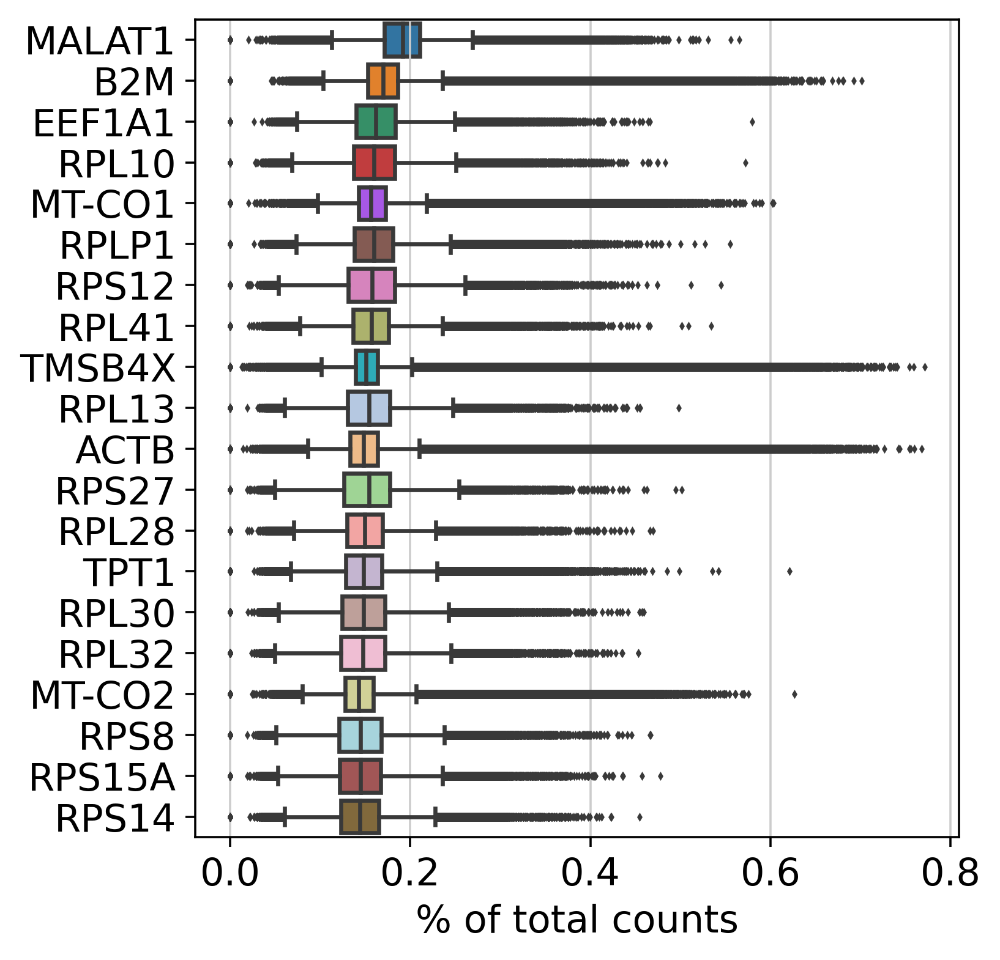

In [22]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [23]:
# QC metrics

In [24]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')

In [25]:
adata.var['ribo'] = adata.var_names.str.startswith(("RP","RPS","RPL"))

In [26]:
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))

In [27]:
adata.var['mt'].value_counts()

False    36253
True        13
Name: mt, dtype: int64

In [28]:
adata.var['ribo'].value_counts()

False    27481
True      8785
Name: ribo, dtype: int64

In [29]:
adata.var['hb'].value_counts()

False    36254
True        12
Name: hb, dtype: int64

In [30]:
sc.pp.calculate_qc_metrics(adata, qc_vars = ['mt', 'ribo', 'hb'], percent_top =[20], log1p = True, inplace = True)


In [31]:
adata

AnnData object with n_obs × n_vars = 985470 × 36266
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'author_cell_type', 'donor_BMI_at_collection', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'Ethnicity_Selfreported', 'TCR_VDJdb', 'TCRa_V_gene', 'TCRa_D_gene', 'TCRa_J_gene', 'TCRa_C_gene', 'TCRb_V_gene', 'TCRb_D_gene', 'TCRb_J_gene', 'TCRb_C_gene', 'TCR_Clonality', 'TCR_Clone_ID', 'BCR_VDJ_V_call', 'BCR_VDJ_D_call', 'BCR_VDJ_J_call', 'BCR_VDJ_C_call', 'BCR_VJ_V_call', 'BCR_VJ_J_call', 'BCR_VJ_C_call', 'BCR_Clonality', 'BCR_Clone_size', 'BCR_mu_freq', 'cell_type', 'sex', 'development_stage', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'feature_is_filtered', 'gene_id', 'mt', 'ribo', 'hb', 'n_cells_by_count

In [32]:
# QC visualisation

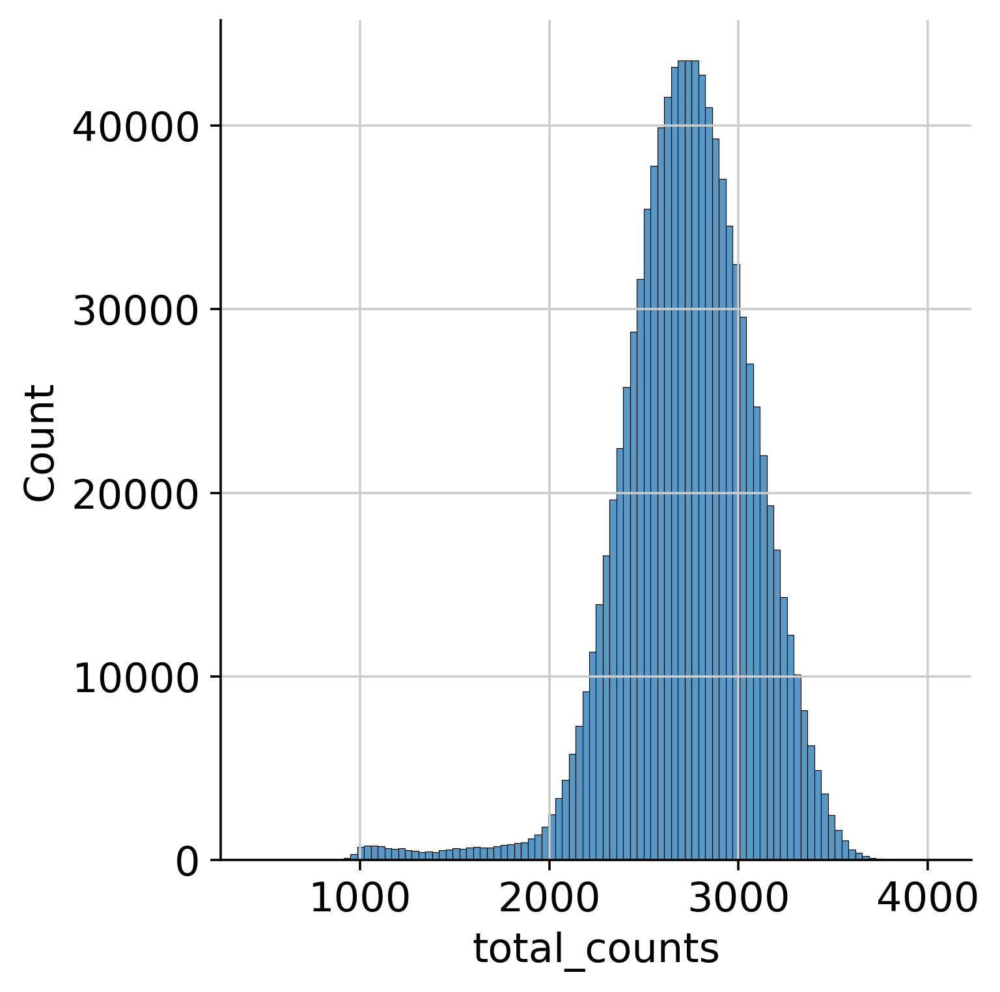

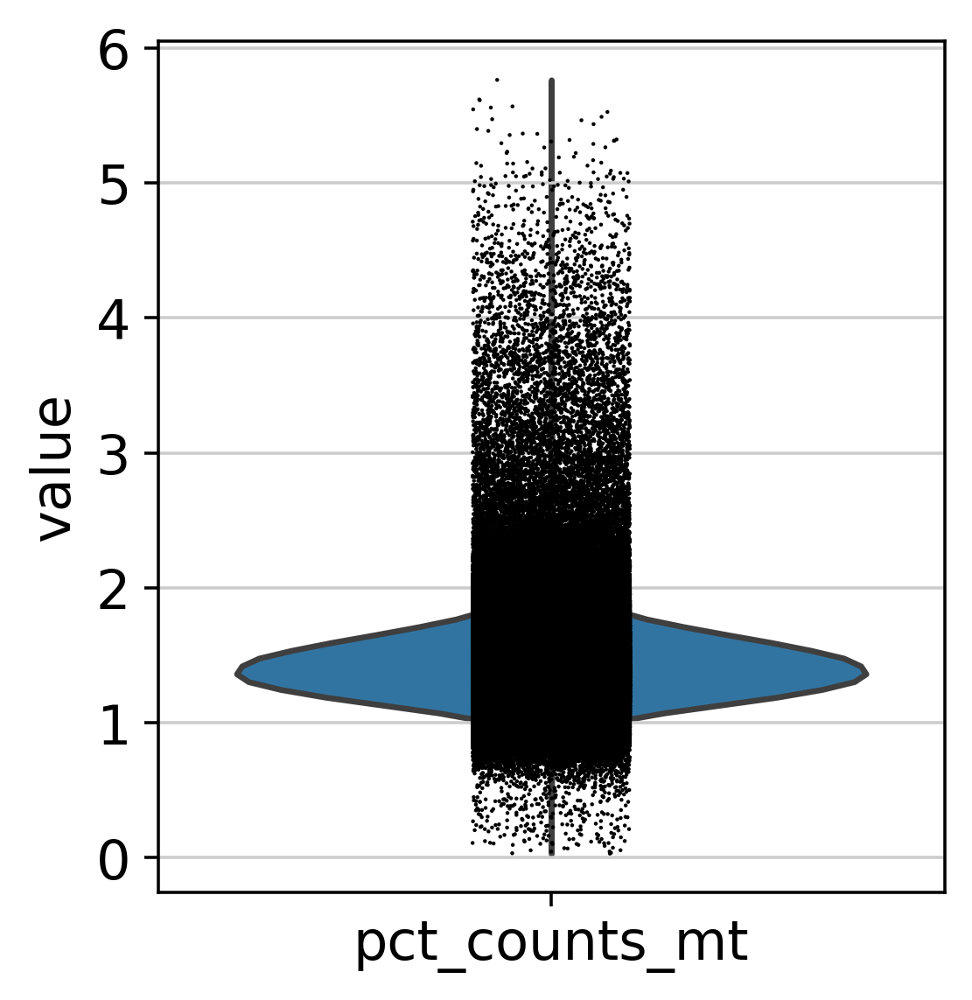

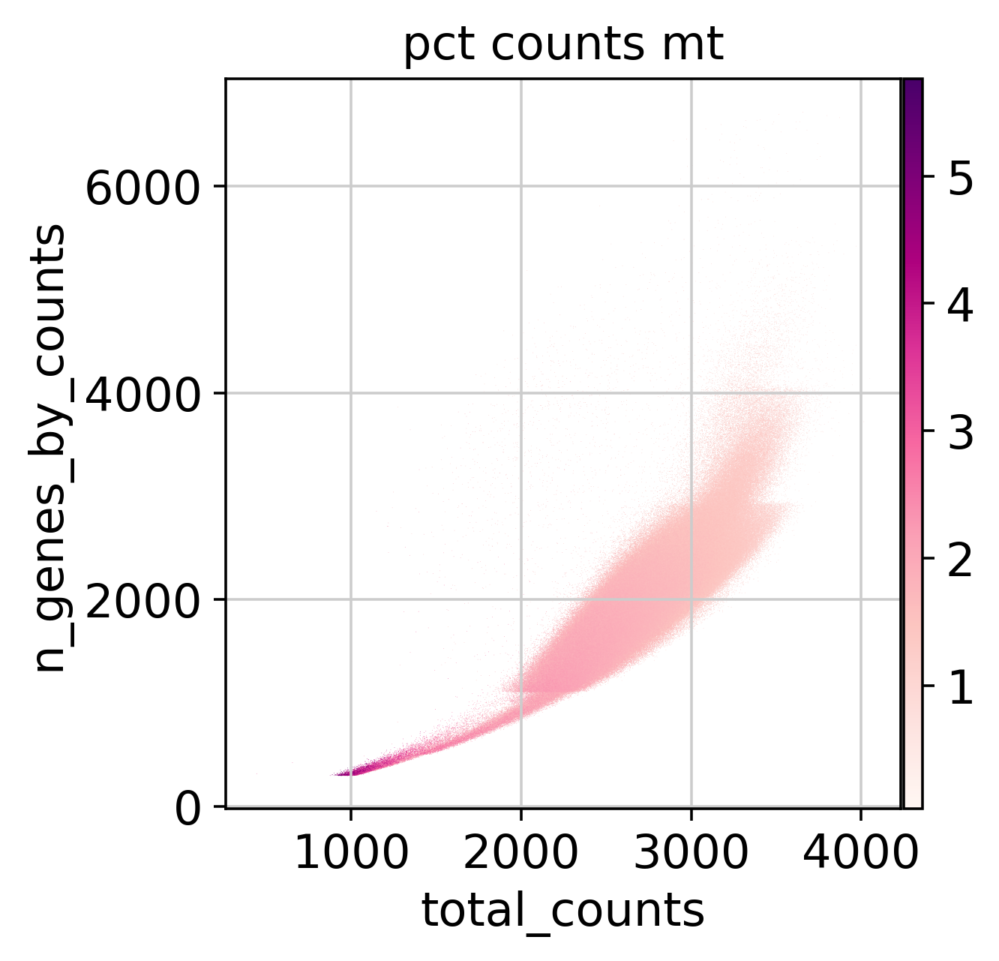

In [33]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

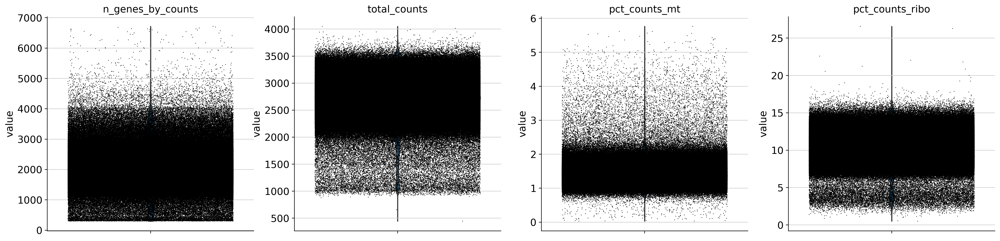

In [34]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

In [35]:
# QC [MADs]-based filtering

In [36]:
adata.shape

(985470, 36266)

In [37]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [38]:
adata

AnnData object with n_obs × n_vars = 985470 × 36266
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'author_cell_type', 'donor_BMI_at_collection', 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'Ethnicity_Selfreported', 'TCR_VDJdb', 'TCRa_V_gene', 'TCRa_D_gene', 'TCRa_J_gene', 'TCRa_C_gene', 'TCRb_V_gene', 'TCRb_D_gene', 'TCRb_J_gene', 'TCRb_C_gene', 'TCR_Clonality', 'TCR_Clone_ID', 'BCR_VDJ_V_call', 'BCR_VDJ_D_call', 'BCR_VDJ_J_call', 'BCR_VDJ_C_call', 'BCR_VJ_V_call', 'BCR_VJ_J_call', 'BCR_VJ_C_call', 'BCR_Clonality', 'BCR_Clone_size', 'BCR_mu_freq', 'cell_type', 'sex', 'development_stage', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'feature_is_filtered', 'gene_id', 'mt', 'ribo', 'hb', 'n_cells_by_count

In [39]:
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
)
adata.obs.outlier.value_counts()

False    962413
True      23057
Name: outlier, dtype: int64

In [40]:
adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (
    adata.obs["pct_counts_mt"] > 8
)
adata.obs.mt_outlier.value_counts()

False    932682
True      52788
Name: mt_outlier, dtype: int64

In [41]:
# Filter object based on QC metrics

print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 985470
Number of cells after filtering of low quality cells: 923976


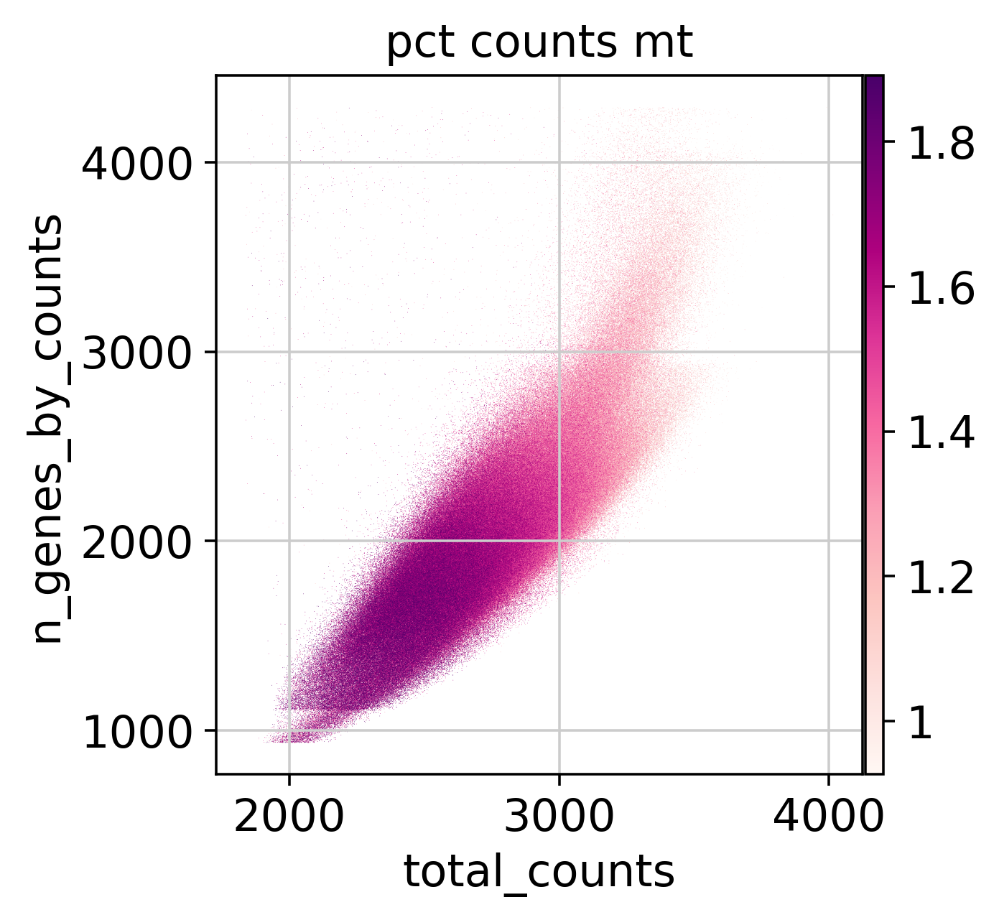

In [42]:
p1 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [43]:
# Add sample sex covariates

In [44]:
annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")

In [45]:
annot.head()

,ensembl_gene_id,start_position,end_position,chromosome_name
external_gene_name,,,,
MT-TF,ENSG00000210049,577,647,MT
MT-RNR1,ENSG00000211459,648,1601,MT
MT-TV,ENSG00000210077,1602,1670,MT
MT-RNR2,ENSG00000210082,1671,3229,MT
MT-TL1,ENSG00000209082,3230,3304,MT


In [46]:
# Y chrom
chrY_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrY_genes

Index(['PLCXD1', 'GTPBP6', 'LINC00685', 'PPP2R3B', 'SHOX', 'CRLF2', 'CSF2RA',
       'IL3RA', 'SLC25A6', 'LINC00106',
       ...
       'TTTY17B', 'TTTY4B', 'BPY2B', 'DAZ3', 'DAZ4', 'BPY2C', 'TTTY4C',
       'TTTY17C', 'CDY1', 'TTTY3'],
      dtype='object', length=112)

In [47]:
adata.obs['percent_chrY'] = np.sum(
    adata[:, chrY_genes].X, axis = 1).A1 / np.sum(adata.X, axis = 1).A1 * 100

In [48]:
# X chrom

In [49]:
chrX_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "X"])
chrX_genes

Index(['PLCXD1', 'GTPBP6', 'LINC00685', 'PPP2R3B', 'SHOX', 'CRLF2', 'CSF2RA',
       'IL3RA', 'SLC25A6', 'LINC00106',
       ...
       'CLIC2', 'H2AB2', 'F8A3', 'H2AB3', 'TMLHE-AS1', 'TMLHE', 'SPRY3',
       'VAMP7', 'IL9R', 'WASIR1'],
      dtype='object', length=941)

In [50]:
adata.obs['percent_chrX'] = np.sum(
    adata[:, chrX_genes].X, axis = 1).A1 / np.sum(adata.X, axis = 1).A1 * 100

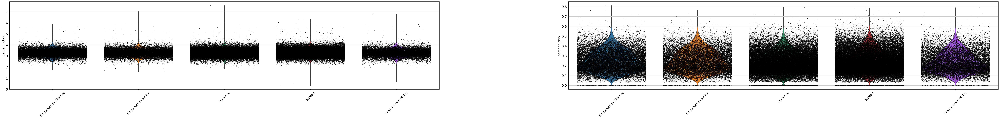

In [51]:
sc.set_figure_params(figsize=(25, 7),dpi=100)
sc.pl.violin(adata, ["percent_chrX", "percent_chrY"], jitter = 0.4, groupby = 'Ethnicity_Selfreported', rotation = 45)

In [59]:
# Export object

In [60]:
adata.write('/home/icb/mairi.mcclean/data/aida_scrna_PBMC_mm_230802_qcd.h5ad')